# Prepare Landsat time series obtained through the Google Earth Engine (GEE)

<font color=gray>This script processes the csv files with NBR time series downloaded from the GEE. Specifically, daily time series are constructed per pixel and stored together with their coordinates in a standard format.

The output is a dataframe (stored as Rdata file), where each row represents a sampled pixel. The first two columns contain the latitude and longitude of the pixel. The next columns contain the NBR values for each observation date (with a temporal frequency of one day).</font>

## 1. Import libraries

In [1]:
library(stringr)
library(tidyr)
library(reshape)
library(zoo)


Attaching package: 'reshape'

The following objects are masked from 'package:tidyr':

    expand, smiths


Attaching package: 'zoo'

The following objects are masked from 'package:base':

    as.Date, as.Date.numeric



## 2. Inputs
<font color=gray>Required user inputs:
1. input folder: directory of the csv file to be processed
2. output folder: directory where the processed files will be stored
3. file name: name of the csv file to be processed</font>

In [2]:
# input folder (directory of the csv files)
ifolder <- 'C:\\Users\\keers001\\OneDrive\ -\ WageningenUR\\RETURN\\Data\\RETURN\\20191019_SimulationOptSAR\\Case_SantaRem\\'#'C:\\Users\\keers001\\Data\\RETURN\\20191019_SimulationOptSAR\\Landsat\\SampledData\\'
# output folder (directory where the processed files will be stored)
ofolder <- 'C:\\Users\\keers001\\OneDrive\ -\ WageningenUR\\RETURN\\Data\\RETURN\\20191019_SimulationOptSAR\\Case_SantaRem\\'#'C:\\Users\\keers001\\Data\\RETURN\\20191019_SimulationOptSAR\\Landsat\\SampledData\\'
# file name (name of the file to be processed)
ifile <- 'LSTS_LSTS_FireArea_SantaRem_smp_40000.csv'#'LSTS_RndmSampleF_NoFire_5_Tree_80_scl_30_npnt_20000.csv'

## 3. Import data

In [3]:
#setwd(ifolder)
dat <- read.csv(file.path(ifolder,ifile))


## 4. Extract year, month and date of each observation

In [4]:
datd <- separate(dat,'system.index',  c("temp", "index"), "_L")
datd <- separate(datd,'index',  c("Landsat", "number", "date", "zeroes"), "_")

datd$date <- as.Date(datd$date,format='%Y%m%d')
datd$year <- format(datd$date, '%Y')
datd$month <- format(datd$date, '%m')
datd$day <- format(datd$date, '%d')


## 5. Get latitude and longitude of each pixel

In [5]:
datd <- separate(datd,'.geo',  c('rm', 'loc'), '\\[')
datd <- separate(datd,'loc',  c('lon', 'loc'), ',')
datd <- separate(datd,'loc',  c('lat', 'loc'), '\\]')
datd$rm <- NULL
datd$loc <- NULL
datd$lat <- as.numeric(datd$lat)
datd$lon <- as.numeric(datd$lon)


## 6. Create regular daily time series for each pixel

In [6]:
# Make a sequence of dates with daily interval
pdates <-seq(as.Date(paste0(min(datd$year), '-01-01')),as.Date(paste0(max(datd$year), '-12-31')),by='1 days',)#length=length(unique(datd$date)) # potential dates for regular time series with 12 day interval
#yri<- 2001
#pdates <-seq(as.Date( paste0(yri,'-01-01')),as.Date(paste0(yri,'-12-31')),by='1 days',)#length=length(unique(datd$date)) # potential dates for regular time series with 12 day interval

# List coordinates of all processed pixels
pix <- unique(datd[,c('lat','lon')])

# Function to make a dataframe with daily observations per pixel
tsPix <- function(data, pdates, pix){
  dfVI <- data.frame(data= matrix(NA, nrow = dim(pix)[1],ncol= (2)))#+length(pdates)
  colnames(dfVI) <- c('lon', 'lat')
  dfVI$lat <- as.numeric(pix$lat)
  dfVI$lon <- as.numeric(pix$lon)
  
  for (d in 1:length(pdates)){#
    dt<-data[which(data$date == pdates[d]), c('lon','lat','mean')]
    # in case no observations for that particular date: make a dataframe with NA values  
    if (dim(dt)[1]==0){
      dt <- data.frame(cbind(dfVI$lon, dfVI$lat, rep( NA, length(dfVI$lat))))
      colnames(dt) <- c('lon','lat', 'mean')
    }
    # rename the columns, so the column name reflects the observation date
    colnames(dt)<- c('lon','lat',as.character(pdates[d]))
    # in case more than 1 observation for a pixel on a date: take mean of the values
    mdt <- melt(dt, id=c("lat","lon")) 
    dtmean <- cast(mdt, lat+lon~variable, mean, na.rm=T)
    dfVI <- merge(dfVI,dtmean,by=c("lon","lat"), all = T)#
  }
    dfVI
}

# Dataframe with the time series per pixel (each column is a pixel, first two rows represent the lat and lon, other rows represent observations for a particular date)
dfVi <- tsPix(datd, pdates, pix)
#dfVi

## 7. Export results to Rdata file
<font color=gray>The dataframe containing regular daily time series for each pixel is stored as an Rdata file. The name of the output file is the same as the input file, extended with '_VI'</font>

In [7]:
ofile <- tools::file_path_sans_ext(ifile)
save(dfVi, file = file.path(ofolder, paste0(ofile,'_VI.rda')))# '_', yri,


## 8. Plot time series

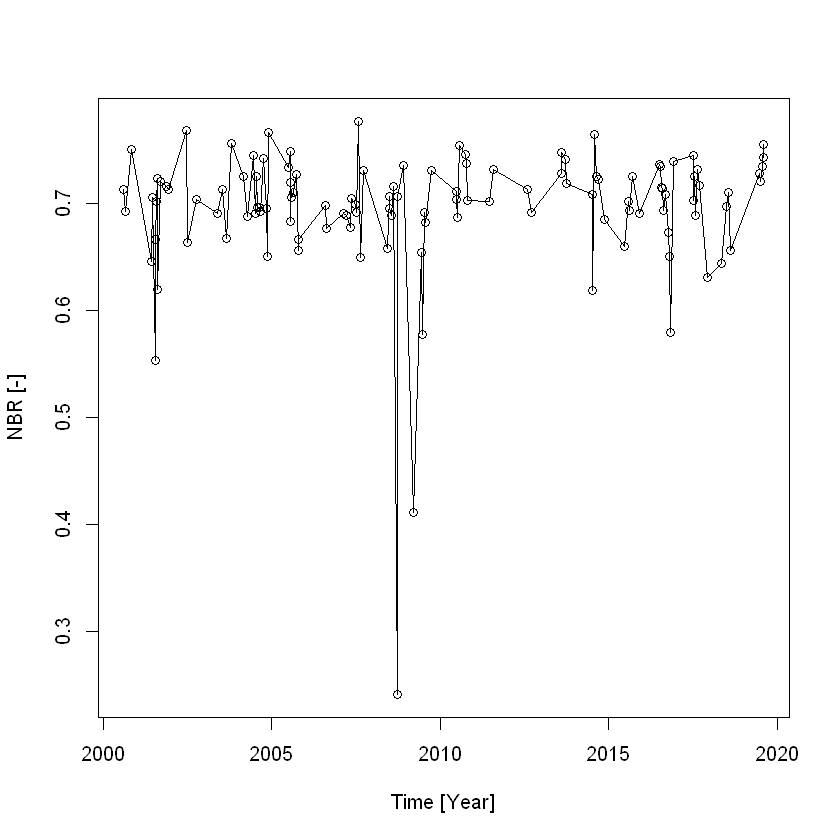

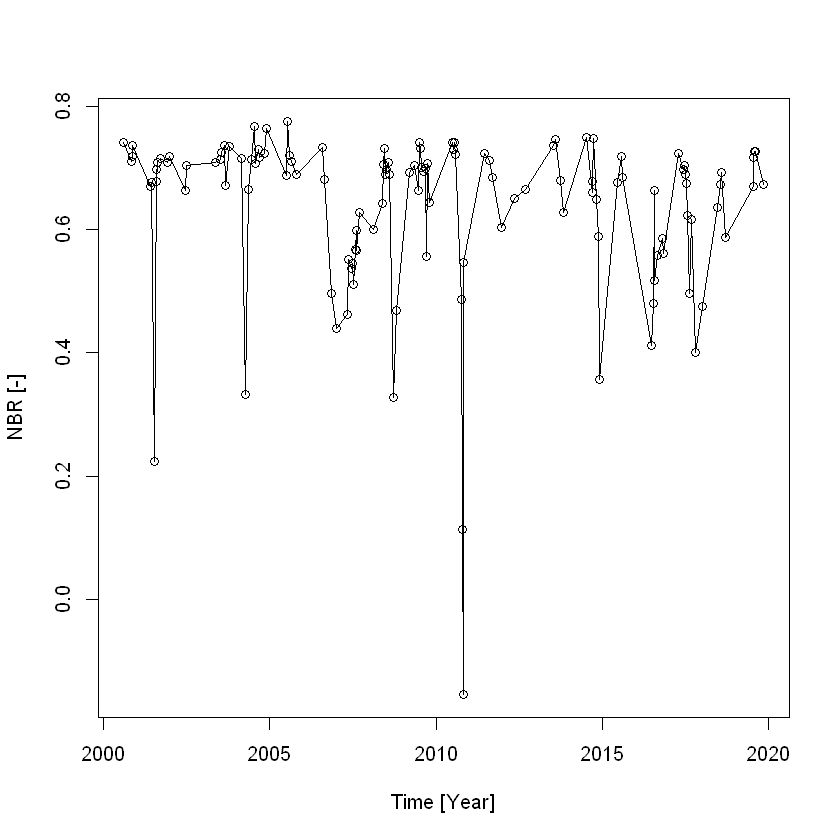

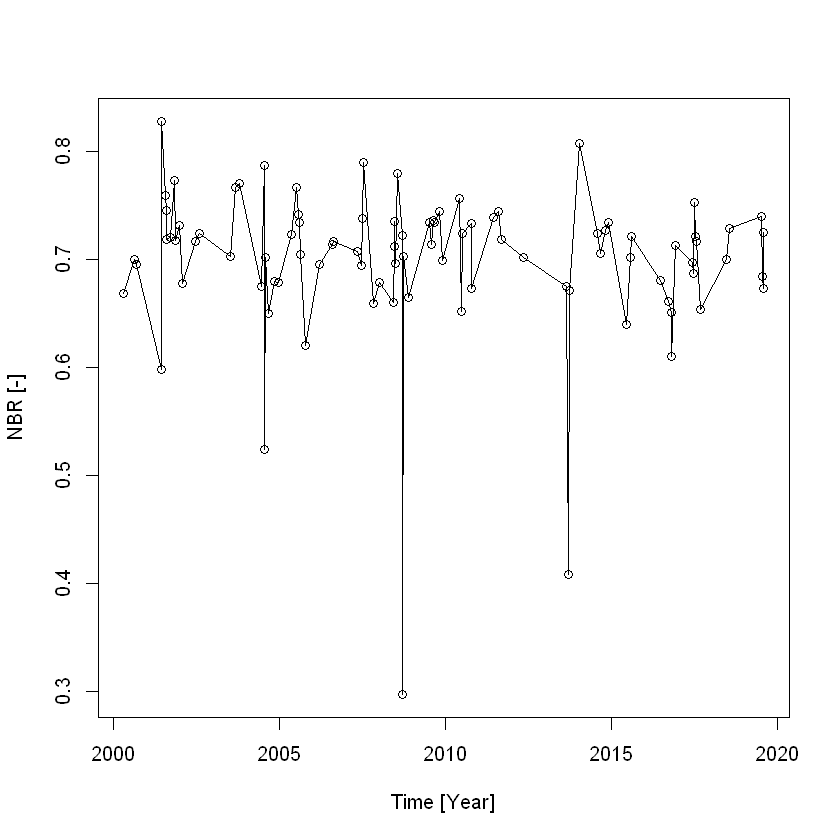

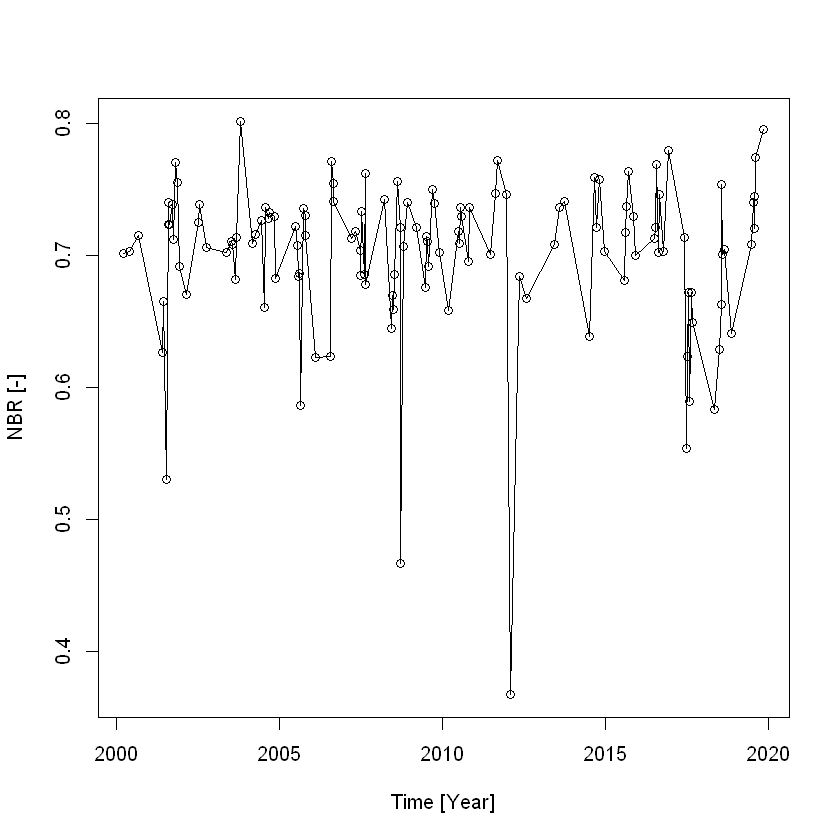

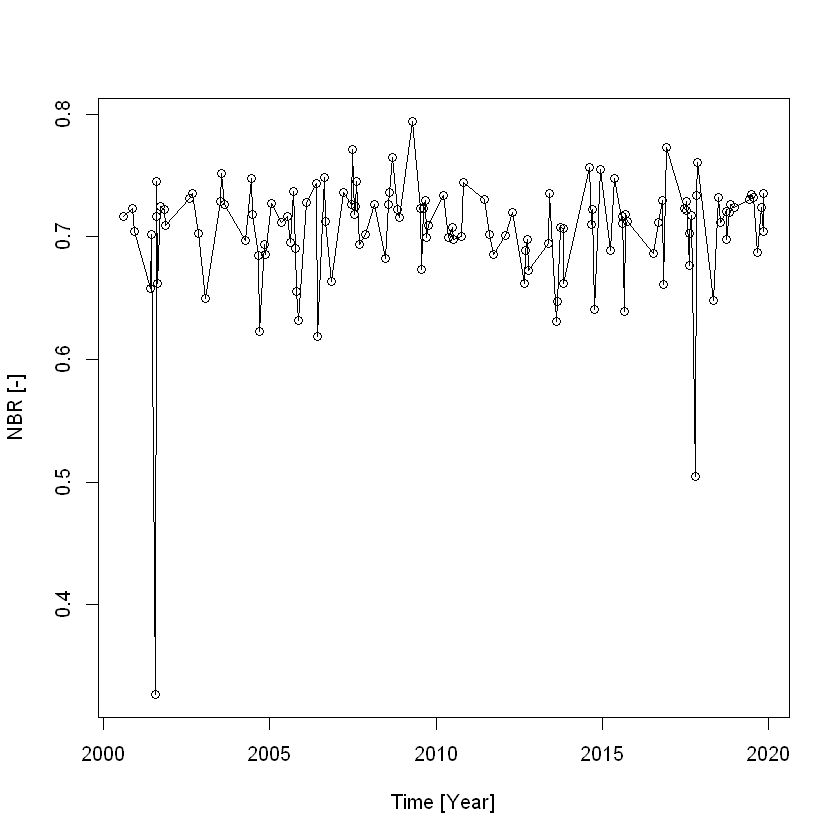

...

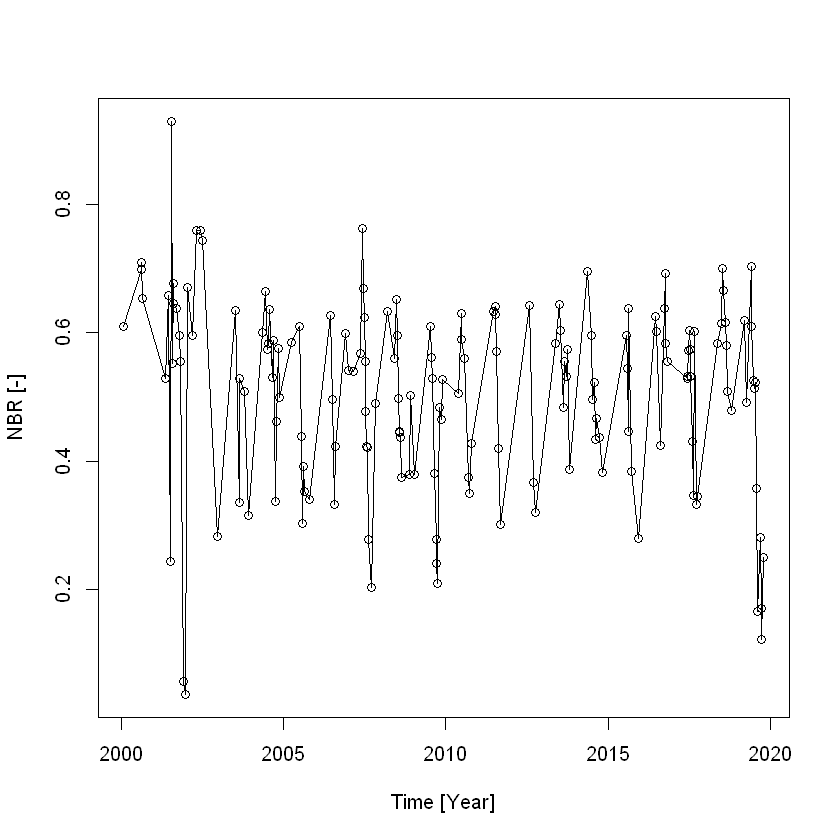

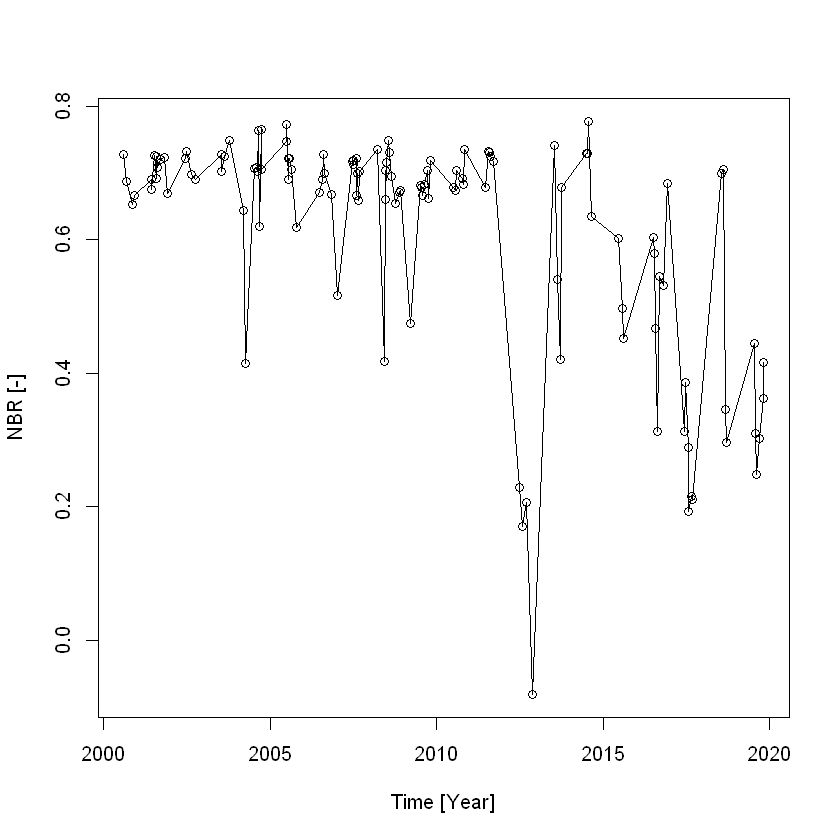

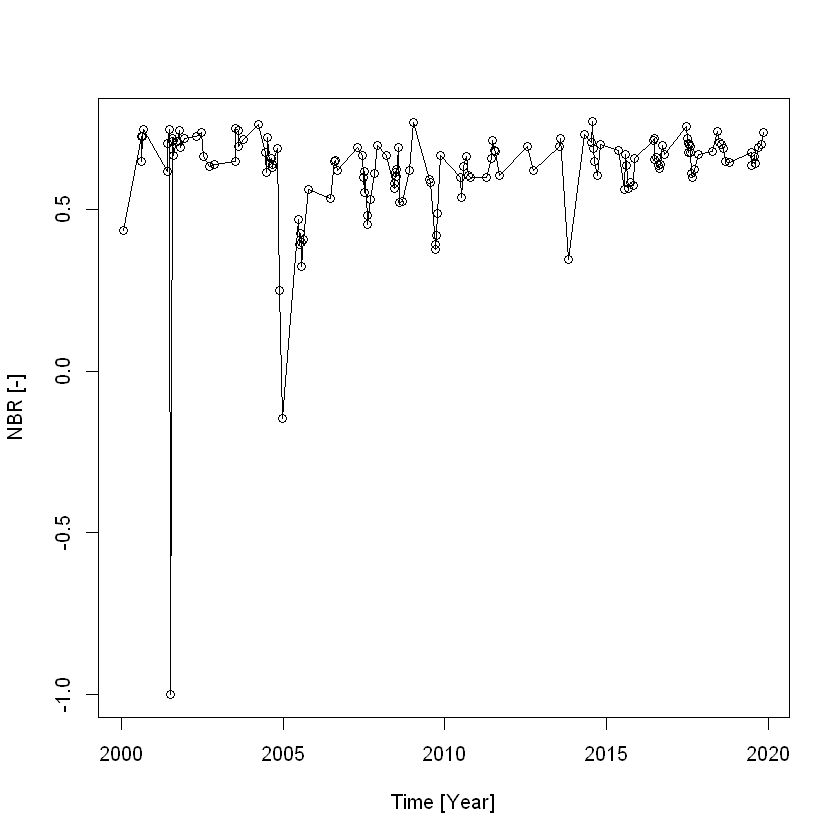

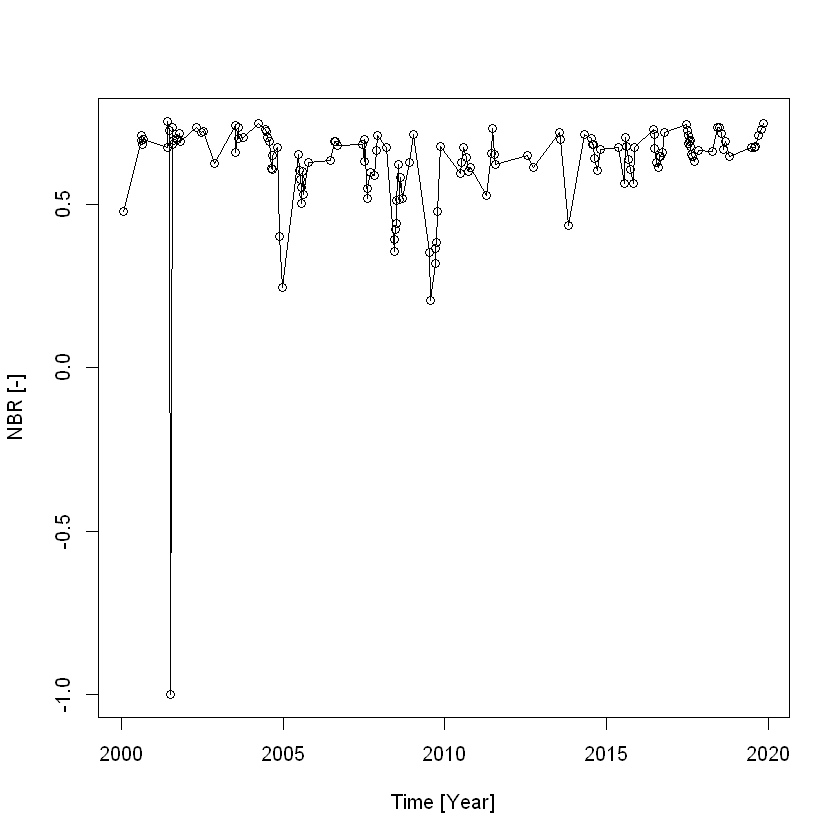

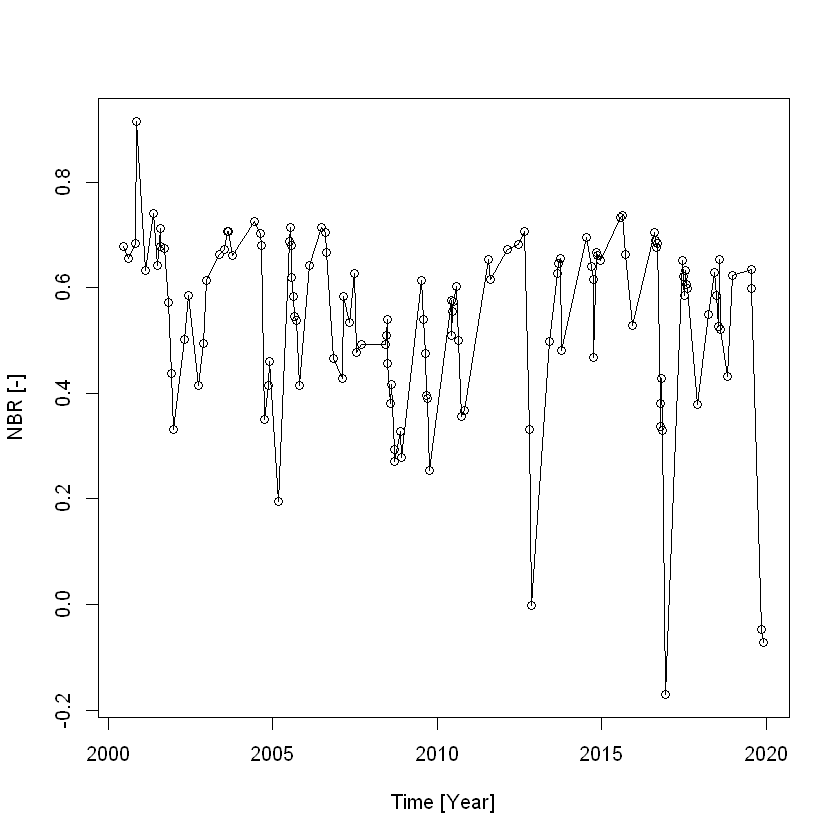

In [ ]:
for(i in 1:dim(dfVi)[1]){
    tmpts <- as.numeric(dfVi[i,-c(1,2)])

plot(zoo(tmpts[is.na(tmpts)==F], pdates[is.na(tmpts)==F]), type = 'o', 
     xlab = 'Time [Year]',
     ylab = 'NBR [-]')
}



In [ ]:
max(pdates)